## Segmentation dataset prepration

In [1]:
import numpy as np
import pandas as pd
import shutil
import tensorflow as tf
from zipfile import ZipFile
import keras.backend as K
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import os
from PIL import Image

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


We want to store our dataset in a pandas dataframe for fast and accurate process. Then we will convert these dataframe to a Tensor. so first let's define our helper functions

In [3]:
def dataframe_creation(ImgPath, name):
    """
    This function is storing path of the images in a dataframe beside of each image id (in image name).
    Walk though the ImgPath and read the directoryPathes and images name in each dir.
    Then append each image full path in a list.
    Extract the image name without the full path and extension and append it to the ids list.
    Please make sure each full path in first list is correspond to the id in second list at the same index.
    Arguments:
      ImgPath: root directory full path
      name: name for column of full pathes in dataframe
    return:
      df: a df contains ids and full path of each image id. call the ids column, id and pathes column, name.
          Please set the ids column to be index in this df.

    """
    ##################################################
    ############### YOUR CODES GO HERE ###############

    ImagePaths = []
    ImageNames = []
    for (directoryPath,directoryName , files) in os.walk(ImgPath):
      for FileName in files:
        ImagePaths.append(directoryPath + '/' + FileName)
        ImageNames.append(FileName.split('.')[0])

    df = {'id': ImageNames, name: ImagePaths}
    df = pd.DataFrame(df)
    df.set_index('id')

    return df
    ##################################################

In [4]:
def display(display_list):
    plt.figure(figsize=(15, 15))

    title = ['Input Image', 'True Mask', 'Predicted Mask']

    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        # a function for showing images
        # please write a code to convert images from tensor to ordinary images
        # use https://docs.w3cub.com/tensorflow~2.3/keras/preprocessing/image/array_to_img
        #### Your Code goes here
        # show the i'th image in display list with array_to_img function in keras
        img = display_list[i]

        # Check if the image is grayscale
        if len(img.shape) == 2:
            # Expand dimensions to add channel dimension
            img = np.expand_dims(img, axis=-1)

            # Convert image array to image object using keras array_to_img
            img = tf.keras.preprocessing.image.array_to_img(img)
            plt.imshow(img, cmap='gray')
        else:
          img = tf.keras.preprocessing.image.array_to_img(img)
          plt.imshow(img)

        plt.axis('off')
    plt.show()

In [11]:
!cd /content/
# !unzip /content/drive/MyDrive/ss_dataset.zip -d .

Creating train and train_masks directories for stroring the processed images

In [7]:
!cd /content/
!mkdir train
!mkdir train_masks
# !mkdir ss_dataset
# from pydrive.auth import GoogleAuth
# from pydrive.drive import GoogleDrive
# from google.colab import auth
# from oauth2client.client import GoogleCredentials

# # Authenticate and create the PyDrive client.
# auth.authenticate_user()
# gauth = GoogleAuth()
# gauth.credentials = GoogleCredentials.get_application_default()
# drive = GoogleDrive(gauth)
# # https://drive.google.com/file/d/1KWnX3eMPJrzhsegi0LmyGUbUV5pqKw_R/view?usp=sharing
# file_id = '1KWnX3eMPJrzhsegi0LmyGUbUV5pqKw_R'
# downloaded = drive.CreateFile({'id':file_id})
# downloaded.FetchMetadata(fetch_all=True)
# downloaded.GetContentFile(downloaded.metadata['title'])
# !unzip ss_dataset.zip -d .

mkdir: cannot create directory ‘train’: File exists
mkdir: cannot create directory ‘train_masks’: File exists
Archive:  ss_dataset.zip
   creating: ./ss_dataset/3/
  inflating: ./ss_dataset/3/210.bmp  
  inflating: ./ss_dataset/3/65_label.bmp  
  inflating: ./ss_dataset/3/495.bmp  
  inflating: ./ss_dataset/3/266.bmp  
  inflating: ./ss_dataset/3/423_label.bmp  
  inflating: ./ss_dataset/3/518_label.bmp  
  inflating: ./ss_dataset/3/540_label.bmp  
  inflating: ./ss_dataset/3/423.bmp  
  inflating: ./ss_dataset/3/221.bmp  
  inflating: ./ss_dataset/3/391.bmp  
  inflating: ./ss_dataset/3/309_label.bmp  
  inflating: ./ss_dataset/3/70.bmp   
  inflating: ./ss_dataset/3/231.bmp  
  inflating: ./ss_dataset/3/90_label.bmp  
  inflating: ./ss_dataset/3/10.bmp   
  inflating: ./ss_dataset/3/554_label.bmp  
  inflating: ./ss_dataset/3/215.bmp  
  inflating: ./ss_dataset/3/425_label.bmp  
  inflating: ./ss_dataset/3/18_label.bmp  
  inflating: ./ss_dataset/3/435.bmp  
  inflating: ./ss_dataset

In [13]:
data_dir = '/content/ss_dataset'
img_size = 256
!rm -rf ./train
!rm -rf ./train_masks
ImgRoot = '/content/train'
labelRoot = '/content/train_masks'

if not os.path.isdir(ImgRoot):
    os.mkdir(ImgRoot)
if not os.path.isdir(labelRoot):
    os.mkdir(labelRoot)



"""
Beacause your images stored beside correspond label, and their format is in .bmp, so
please first store path of all images in a common list.
Then separate labels (which have _label pattern in their name) from images and store them in
images and labels lists.
For each image and label file, read it with PIL image lib. and resize them to 256*256.
Then convert them to png file
At last save them in ImgRoot and labelRoot directories in a way none of the files with the same name are lost
for reading images:
    https://www.geeksforgeeks.org/python-pil-image-open-method/
for saving images:
    https://www.geeksforgeeks.org/python-pil-image-save-method/
"""


################################################
############## YOUR CODES GO HERE ##############
images = list()
labels = list()

for (directoryPath, directoryName, files) in os.walk(data_dir):
  for filename in files:
    img_name = filename.split('.')[0]
    if 'label' in img_name:
      labels.append(directoryPath + f'/{filename}')
    else:
      images.append(directoryPath + f'/{filename}')

for img_path in images:
  FileName = img_path.split('/')[-1].split('.')[0]
  img = Image.open(img_path)
  img = img.resize((256, 256))
  dir_name = img_path.split('/')[-2]
  img.save(ImgRoot + '/' + dir_name + '_' + FileName + '.png', 'png')

for label_path in labels:
  FileName = label_path.split('/')[-1].split('.')[0].replace('_label', '')
  img = Image.open(label_path)
  img = img.resize((256, 256))
  dir_name = label_path.split('/')[-2]
  img.save(labelRoot + '/' + dir_name + '_' + FileName + '.png', 'png')
################################################

In [14]:
print("Train set:  ", len(os.listdir("/content/train")))
print("Train masks:", len(os.listdir("/content/train_masks")))

Train set:   2308
Train masks: 2308


In [15]:

DataFarameTrain = dataframe_creation(ImgRoot, 'ImgPath')
DataFarameLabel = dataframe_creation(labelRoot, 'LabelPath')
DataFarameTrain['LabelPath'] = DataFarameLabel['LabelPath']
################################################

In [16]:
DataFarameTrain.head()

,id,ImgPath,LabelPath
0,0_408,/content/train/0_408.png,/content/train_masks/0_408.png
1,5_41,/content/train/5_41.png,/content/train_masks/5_41.png
2,3_541,/content/train/3_541.png,/content/train_masks/3_541.png
3,4_107,/content/train/4_107.png,/content/train_masks/4_107.png
4,3_319,/content/train/3_319.png,/content/train_masks/3_319.png


In [17]:
size = [256, 256]

def data_augmentation(img, LabelImage):
    """
    A function for data augmentation.
    We wanna just do some flips.
    Just make a random number, if it was greater than 0.5 do a lef_right flip
    hint:
      https://www.tensorflow.org/api_docs/python/tf/random/uniform
      https://www.tensorflow.org/api_docs/python/tf/image/flip_left_right
    Arguments:
      img: image tensor
      LabelImage: mask image tensor
    return:
      img, LabelImage
    """
    Fliped_y = LabelImage
    Fliped_x = img

    if np.random.randint(0, 1) > 0.5:
      Fliped_x = tf.image.flip_left_right(img)
      Fliped_y = tf.image.flip_left_right(LabelImage)

    return Fliped_x, Fliped_y

def preprocessing(path, LabelPath):
    '''
    Do the usual preprocessing steps for image processing algorithms
    Read image tensors. decode them, resize to size, cast them fo float dtype and normalize between 0-1
    Hint:
      https://www.tensorflow.org/api_docs/python/tf/io/read_file
      https://www.tensorflow.org/api_docs/python/tf/io/decode_jpeg
      https://www.tensorflow.org/api_docs/python/tf/image/resize
      https://www.tensorflow.org/api_docs/python/tf/cast
    Set channels in decoding to 3
    Arguments:
      path: image path
      LabelPath: mask image path
    return:
      pre_processed image and mask image tensors
    '''
    ################################################
    ############## YOUR CODES GO HERE ##############
    img = tf.io.read_file(path)
    img = tf.io.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, size)
    img = tf.cast(img, tf.float32)/255.0

    LabelImage = tf.io.read_file(LabelPath)
    LabelImage = tf.io.decode_jpeg(LabelImage, channels=3)
    LabelImage = tf.image.resize(LabelImage, size)
    LabelImage = LabelImage[:, :, 0]
    LabelImage = tf.math.sign(LabelImage)

    return img, LabelImage
    ################################################

def create_dataset(df, train = False):
    '''
    A function for applying preprocessing and augmentation steps.
    Augment data just in train mode.
    First make a Dataset of tensors to reach high speed and ability.
    Then apply needed steps.
    For creating dataset, please use tensorflow-tf-data-dataset-from_tensor_slices to get
      a dataset of images and correspondig masks path. use values of ImgPath and LabelPath columns of your dataframe
    Then use map function of created ds and call above functions respectively.
    use tf.data.AUTOTUNE in map function
    Hint:
      https://www.geeksforgeeks.org/tensorflow-tf-data-dataset-from_tensor_slices/
      https://www.tensorflow.org/api_docs/python/tf/data/Dataset
    Arguments:
      df: dataframe of images with masks path.
      train: boolean for switching between train and inference mode.
    return:
      dataset
    '''
    ################################################
    ############## YOUR CODES GO HERE ##############
    ds = tf.data.Dataset.from_tensor_slices((df['ImgPath'].values, df['LabelPath'].values))
    ds = ds.map(preprocessing, tf.data.AUTOTUNE)
    if train:
      ds = ds.map(data_augmentation, tf.data.AUTOTUNE)

    return ds
    ################################################

In [18]:
### first split the dataframe to train and val (with train_test_split) then create dataset from each df
DataFarameTrain, valid_df = train_test_split(DataFarameTrain, test_size=0.2)
train = create_dataset(DataFarameTrain, True)
valid = create_dataset(valid_df)

In [19]:
TRAIN_LENGTH = len(DataFarameTrain)
BATCH_SIZE = 24
BUFFER_SIZE = 1000

In [20]:

databaseTrain = train.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat()
databaseTrain = databaseTrain.prefetch(buffer_size=tf.data.AUTOTUNE)
databasevalid = valid.batch(BATCH_SIZE)


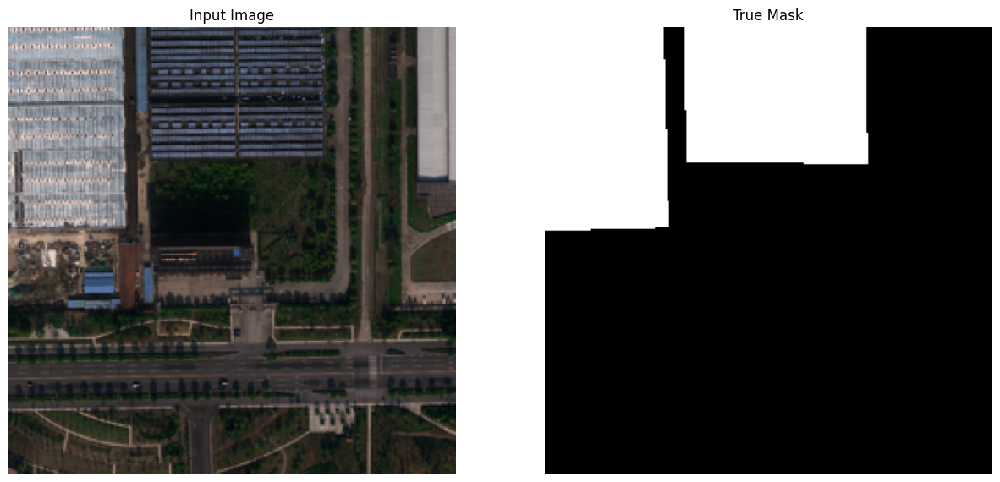

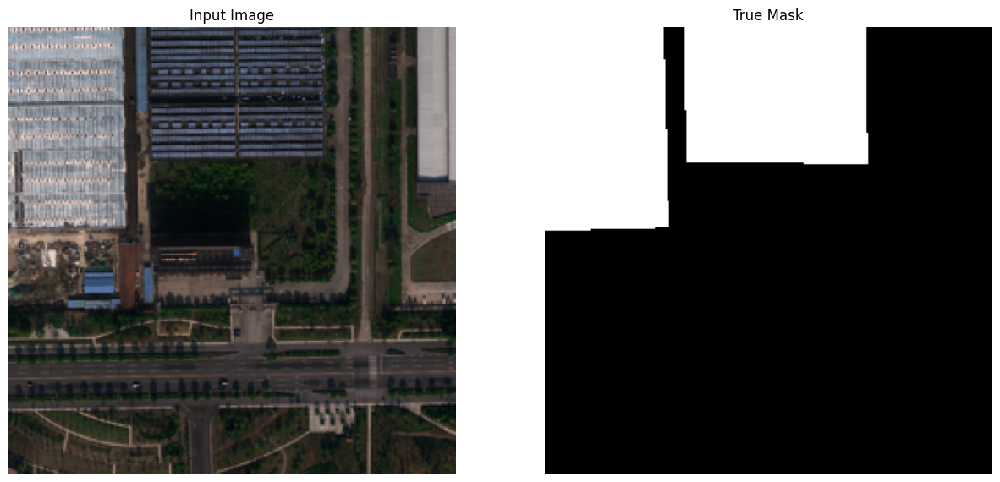

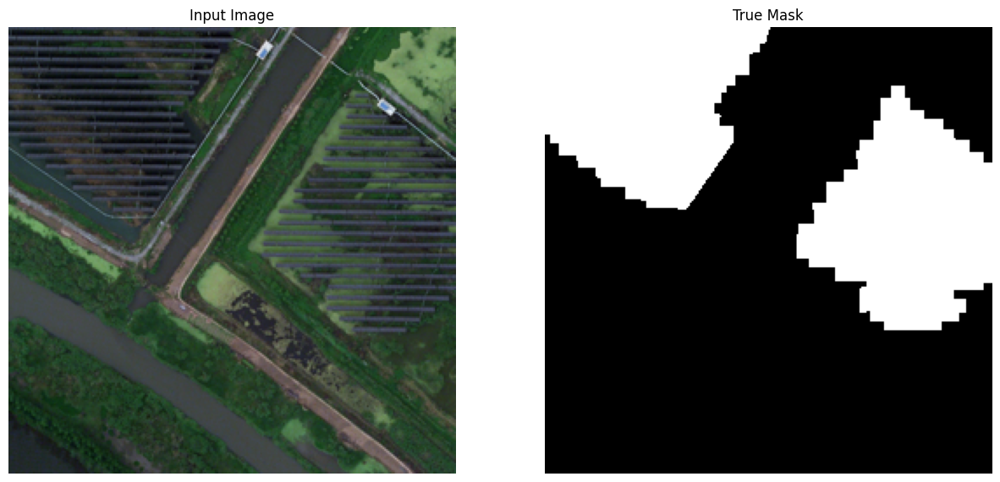

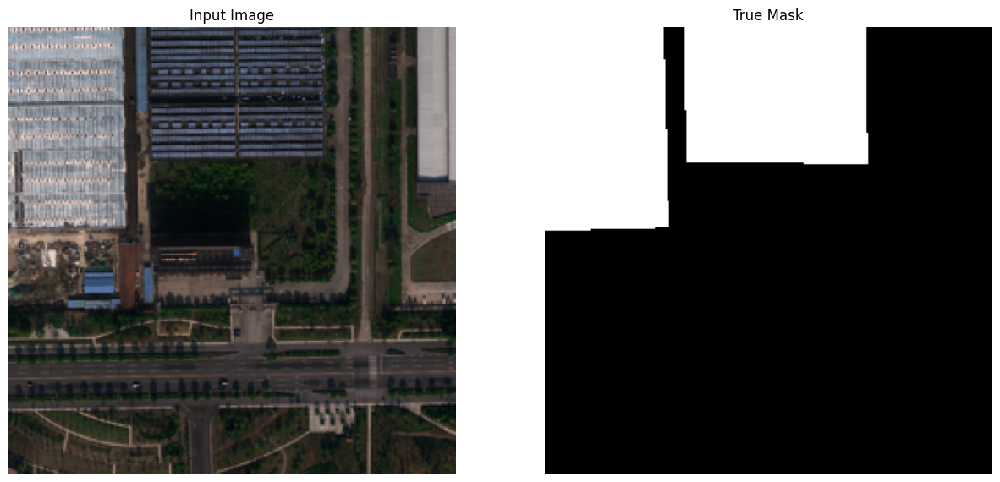

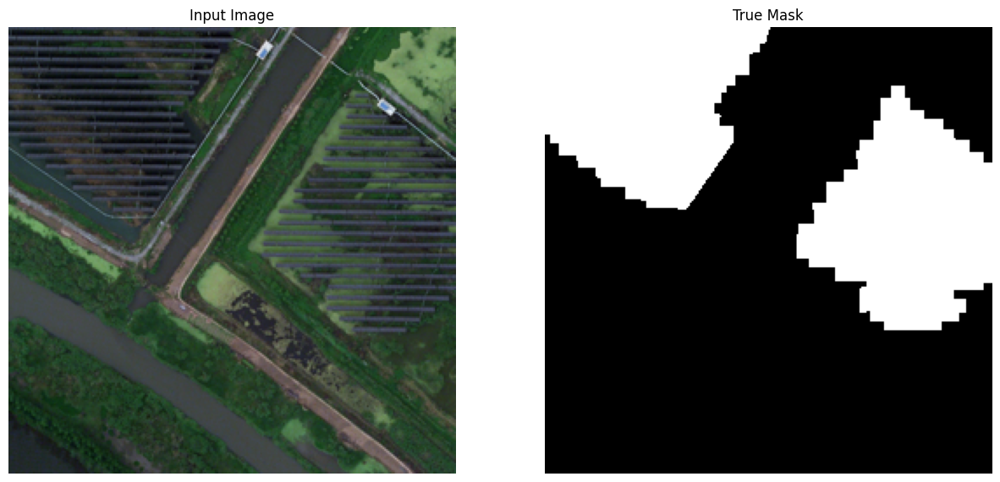

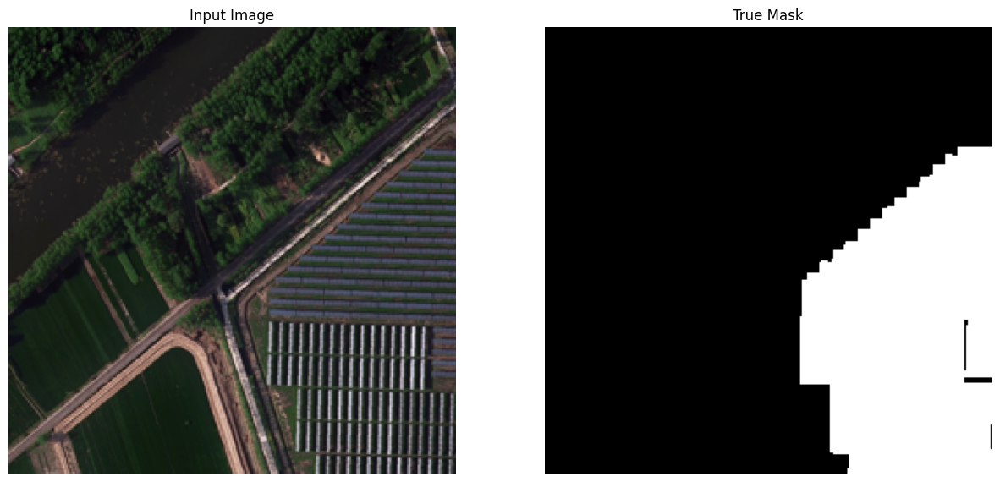

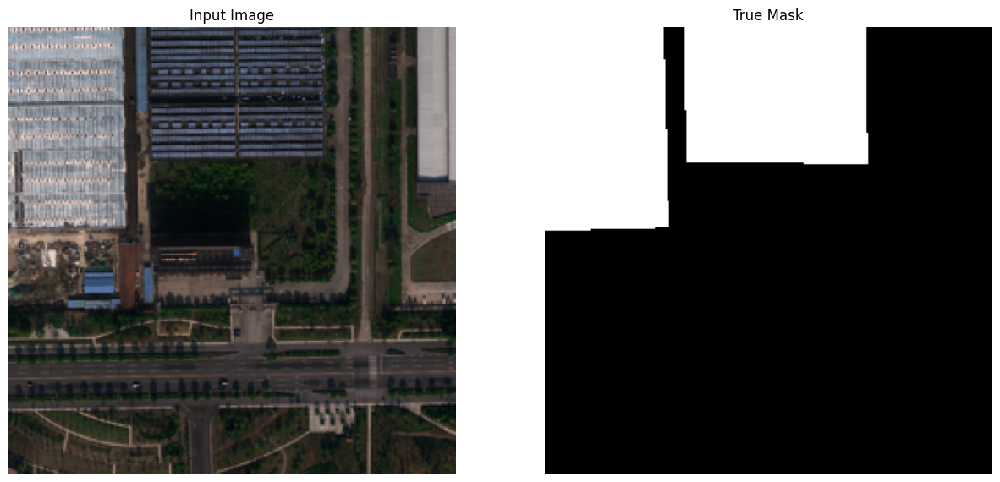

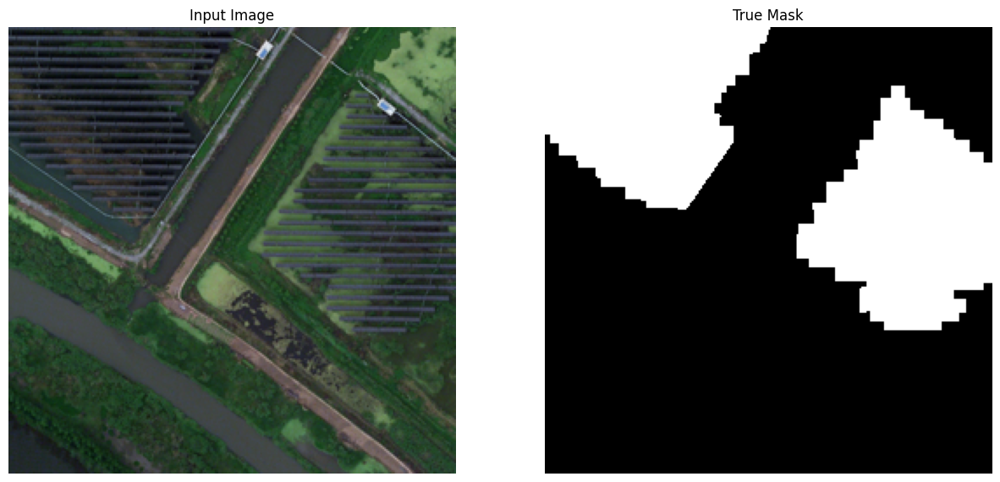

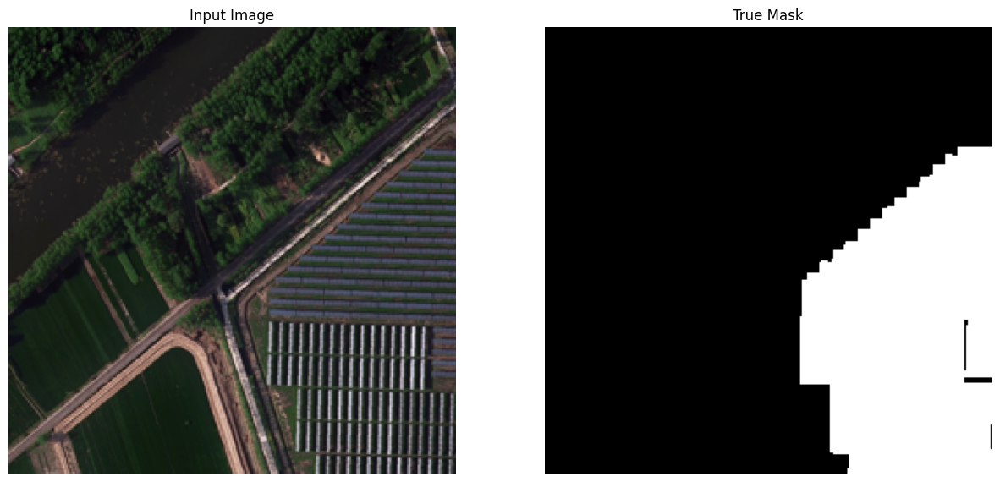

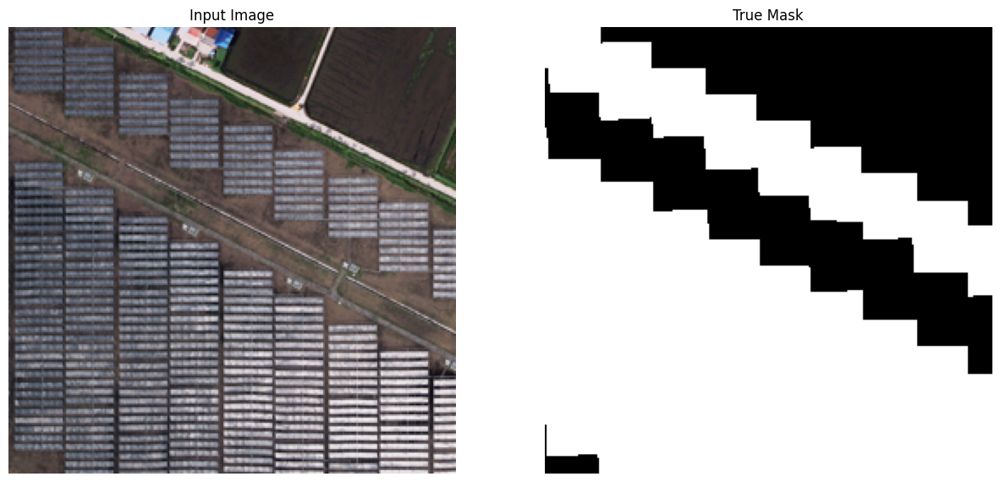

In [21]:
for i in range(5):
    for image, mask in train.take(i):
        sample_x, sample_y = image, mask
        display([sample_x, sample_y])

Till now we created our dataset, let's implement the model and train it on created dataset

In this notebook we're going to implement [U-Net](https://arxiv.org/abs/1505.04597) model for semantic segmentation.
For its back, we'll use [MobileNetV2](https://arxiv.org/abs/1801.04381) architecture.

## U-Net model for segmentation

In [24]:
"""
First load the pre-trained weights of mobilenetv2. Because amount of our data is limited its better to use
transfer learning. Set the input_shape of the model to size, and please don't include the top of this model.
According to U-Net architecture, because we have skip connections in multiple steps of back, please
get the below layers's endpoint from back:
    block_1_expand_relu   # 64x64
    block_3_expand_relu   # 32x32
    block_6_expand_relu   # 16x16
    block_13_expand_relu  # 8x8
    block_16_project
Store them in a list.
Create your model with mobilenetv2 input layer and extracted output layers.
Freeze back and don't train it.
Hint:
  https://www.tensorflow.org/api_docs/python/tf/keras/applications/mobilenet_v2/MobileNetV2
  https://www.tensorflow.org/api_docs/python/tf/keras/Model
"""
size = (256, 256)
################################################
############## YOUR CODES GO HERE ##############
back = tf.keras.applications.MobileNetV2(size + (3,), include_top=False, weights='imagenet')
# back = tf.keras.applications.MobileNetV2(size + (3,), include_top=False, )
namesoflayers = ['block_1_expand_relu', 'block_3_expand_relu', 'block_6_expand_relu',
               'block_13_expand_relu', 'block_16_project']
outputL = [back.get_layer(name).output for name in namesoflayers]
back = tf.keras.Model(inputs=back.input, outputs=outputL)
back.trainable = False
################################################

In [25]:
def upsample(filters, size):
    '''
    in this function we have to define the decoder section of the u-net model.
    we call it upsampling process.
    for each down-sampling in the back, we have a up-sampling in decoder.
    we should implement decoder in a way to double the spatial resolution of the input tensor.
    bacause the inputs, are our features, we should learn how to double the spatial resolution instead of
    resizing methods for ignoring inserting fake features to our feature vectors.
    it's a crucial statement.
    so use a transpose conv2d function and double spatial resolution of the input tensor
    this layer should get the filters as output channel, size for filter size, 2 for stride.
    use same padding in it.
    define the initializer for kernel initializer and use False for use_bias.
    Use a sequential model for stacking layers.
    Finally add a batchnormalization layer at the end of the model. (use dafult args)
    Hint:
      https://www.tensorflow.org/api_docs/python/tf/keras/Sequential
      https://www.tensorflow.org/api_docs/python/tf/keras/layers/Conv2DTranspose
      https://www.tensorflow.org/api_docs/python/tf/keras/layers/BatchNormalization
    Atguments:
      filters: number of input channels
      size: spatial dimention of filters
    return:
      decoder layers
    '''
    initializer = tf.random_normal_initializer(0., 0.02)

    ################################################
    ############## YOUR CODES GO HERE ##############
    newmodel = tf.keras.Sequential()
    newmodel.add(tf.keras.layers.Conv2DTranspose(filters=filters, kernel_size=size, strides=(2, 2),
                                              padding='same', kernel_initializer=initializer, use_bias=False))
    newmodel.add(tf.keras.layers.BatchNormalization())


    ################################################

    return newmodel

up_stack = [
    upsample(512, 3),  # 4x4 -> 8x8
    upsample(256, 3),  # 8x8 -> 16x16
    upsample(128, 3),  # 16x16 -> 32x32
    upsample(64, 3),   # 32x32 -> 64x64
]

In [28]:
def unet_model(output_channels):
    '''
    Now we have to stack back with decoder.
    First define a Input layer to get the images (consider the size).
    Then give the result to the back and get the outputs of this encoder.
    you will get a list of outputs.
    store the last element of this list for input of the decoder.
    Reverse the outputs list except last element and keep them as skip connections.
    now iterate up_stack and skips lists simultaneously, give the previous last feature vector to the
    decoder part and get the output. concat that with current skip from back and name it as same as
    the last output to make it input of the next decoder layer.
    Finally, use a transpose conv2d layer to get the final coarse map.
    this layer should get the output_channels as output channel, 3 for filter size, 2 for stride, sigmoid for activation function.
    use same padding in it.
    give the last output of the decor to it and use as your model's main output.
    Hint:
      http://man.hubwiz.com/docset/TensorFlow.docset/Contents/Resources/Documents/api_docs/python/tf/keras/layers/Input.html
      https://www.tensorflow.org/api_docs/python/tf/keras/layers/Concatenate
      https://www.tensorflow.org/api_docs/python/tf/keras/layers/Conv2DTranspose
      https://www.tensorflow.org/api_docs/python/tf/keras/Model
    '''
    ################################################
    ############## YOUR CODES GO HERE ##############
    inputs = tf.keras.layers.Input(shape=size + (3,))
    back_outputs = back(inputs)
    temp = back_outputs[-1]
    reversed_encoder_back = reversed(back_outputs[0:-1])
    for dec, b in zip(up_stack, reversed_encoder_back):
        temp = dec(temp)
        temp = tf.keras.layers.concatenate([temp, b])

    last_classifier = tf.keras.layers.Conv2DTranspose(output_channels, 3, strides=2, activation='sigmoid', padding='same')
    temp = last_classifier(temp)
    mymodel = tf.keras.Model(inputs=inputs, outputs=temp)
    return mymodel
    ################################################

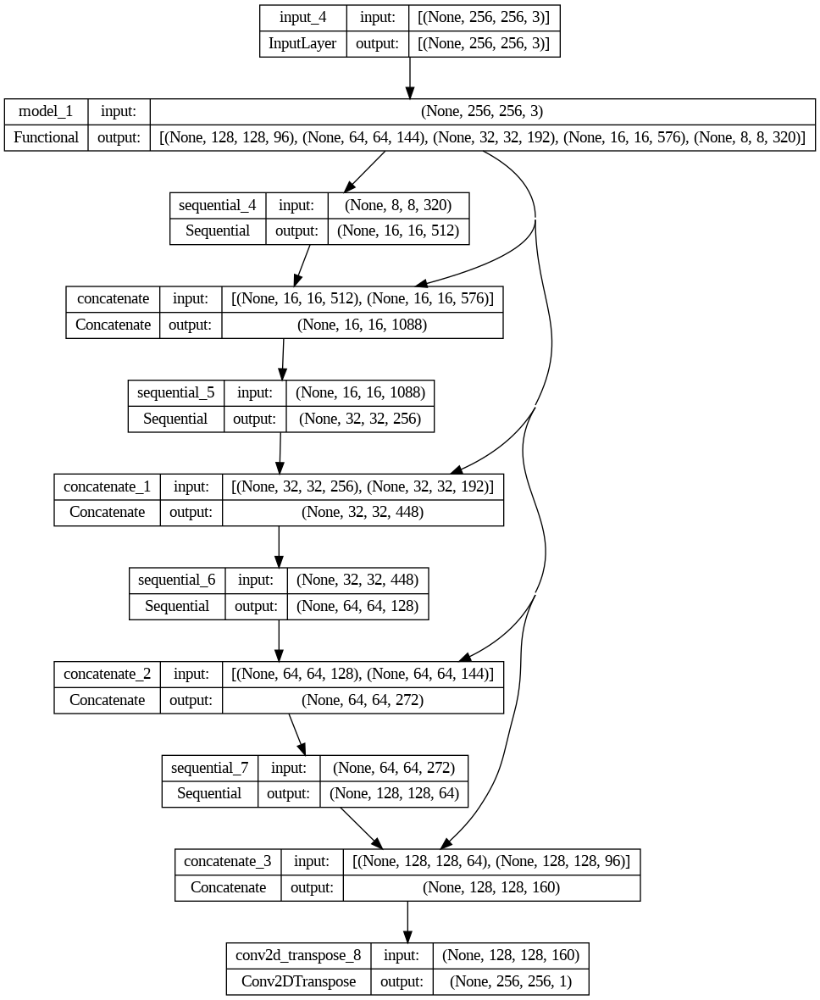

In [29]:
def dice_loss(in_gt, in_pred):
    return 1-dice_coef(in_gt, in_pred)

def dice_coef(y_true, y_pred, smooth=1):
    y_pred = tf.expand_dims(y_pred, axis=-1)
    y_true = tf.expand_dims(y_true, axis=-1)
    intersection = K.sum(y_true * y_pred, axis=[1,2,3])
    union = K.sum(y_true, axis=[1,2,3]) + K.sum(y_pred, axis=[1,2,3])
    return K.mean( (2. * intersection + smooth) / (union + smooth), axis=0)




newmodel = unet_model(1)
newmodel.compile(optimizer='adam',
              loss=dice_loss,
              metrics=['binary_accuracy', dice_coef])
############################################

## plot the graph of the new model with each layer's shape
## hint: https://www.tensorflow.org/api_docs/python/tf/keras/utils/plot_model


############################################
######### YOUR CODE GOES HERE ###############
tf.keras.utils.plot_model(newmodel, show_shapes=True)
############################################

1/1 [==============================] - 12s 12s/step


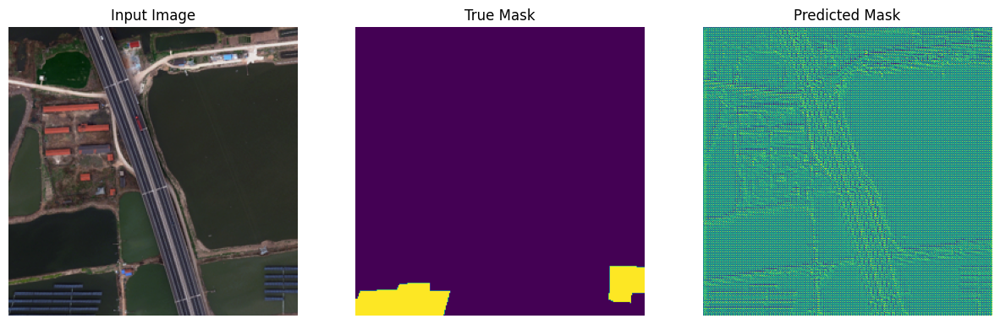

In [30]:
for images, masks in databaseTrain.take(1):
    for img, mask in zip(images, masks):
        sample_x = img
        sample_y = mask
        break

def visualize(display_list):
    plt.figure(figsize=(15, 15))
    title = ['Input Image', 'True Mask', 'Predicted Mask']
    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        img = display_list[i]
        if len(img.shape) == 2:
          img = np.expand_dims(img, axis=-1)
        plt.imshow(tf.keras.preprocessing.image.array_to_img(img))
        plt.axis('off')
    plt.show()

def show_predictions(sample_x, sample_y):
    pred_mask = newmodel.predict(sample_x[tf.newaxis, ...])
    pred_mask = pred_mask.reshape(size[0],size[1],1)
    visualize([sample_x, sample_y, pred_mask])


## let's see some the outputs of pre-trained model
show_predictions(sample_x, sample_y)

In [31]:
newmodel.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 model_1 (Functional)           [(None, 128, 128, 9  1841984     ['input_4[0][0]']                
                                6),                                                               
                                 (None, 64, 64, 144                                               
                                ),                                                                
                                 (None, 32, 32, 192                                         

In [ ]:
### first define a early stop callback for preventing overfitting.
### set patience=4 and True the restore_best_weight
### Hint: https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping
earlystop = tf.keras.callbacks.EarlyStopping(patience=4, restore_best_weights=True)


class DisplayCallback(tf.keras.callbacks.Callback):
    def on_epoch_begin(self, epoch, logs=None):
        if (epoch + 1) % 5 == 0:
            show_predictions(sample_x, sample_y)

EPOCHS = 30
STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE
history = newmodel.fit(databaseTrain, validation_data=databasevalid, epochs=EPOCHS, steps_per_epoch=STEPS_PER_EPOCH, callbacks=earlystop)
############################################

Epoch 1/30
76/76 [==============================] - 35s 249ms/step - loss: 0.3365 - binary_accuracy: 0.8606 - dice_coef: 0.6635 - val_loss: 0.2243 - val_binary_accuracy: 0.9247 - val_dice_coef: 0.7752
Epoch 2/30
76/76 [==============================] - 20s 231ms/step - loss: 0.1880 - binary_accuracy: 0.9532 - dice_coef: 0.8120 - val_loss: 0.1745 - val_binary_accuracy: 0.9506 - val_dice_coef: 0.8242
Epoch 3/30
76/76 [==============================] - 43s 569ms/step - loss: 0.1720 - binary_accuracy: 0.9577 - dice_coef: 0.8280 - val_loss: 0.1687 - val_binary_accuracy: 0.9532 - val_dice_coef: 0.8298


1/1 [==============================] - 1s 848ms/step


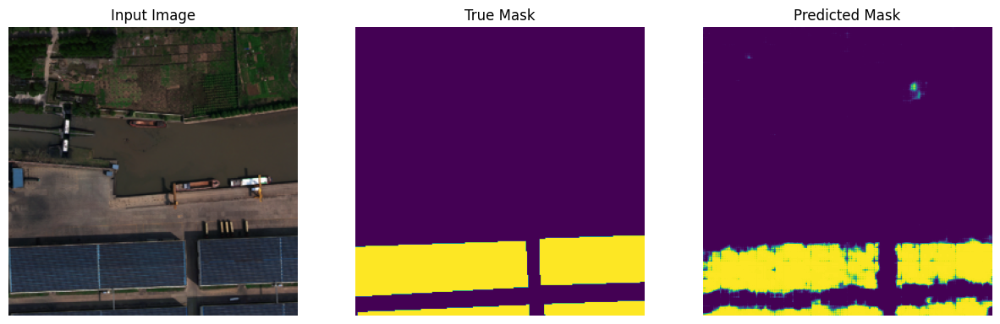

1/1 [==============================] - 0s 28ms/step


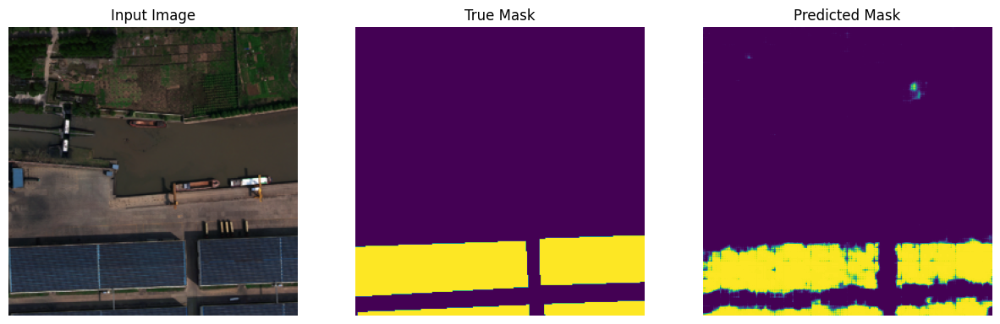

1/1 [==============================] - 0s 32ms/step


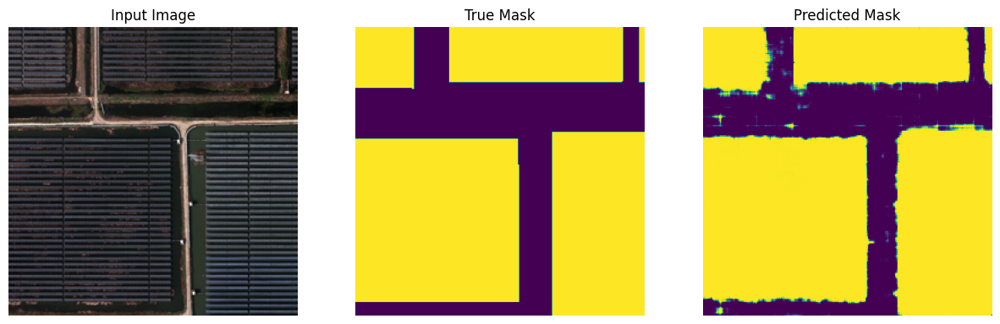

1/1 [==============================] - 0s 28ms/step


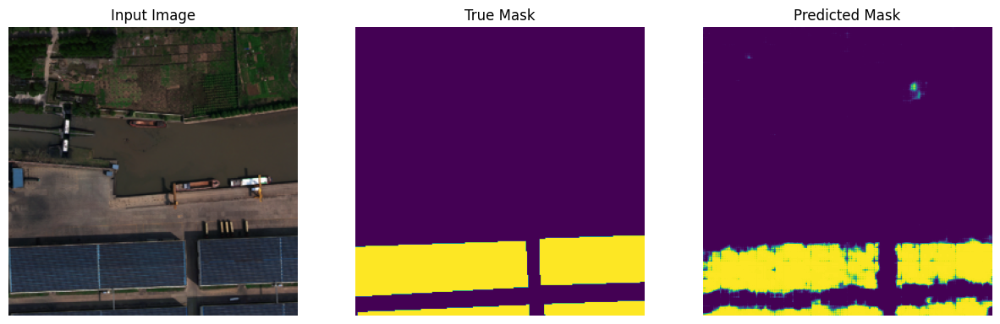

1/1 [==============================] - 0s 44ms/step


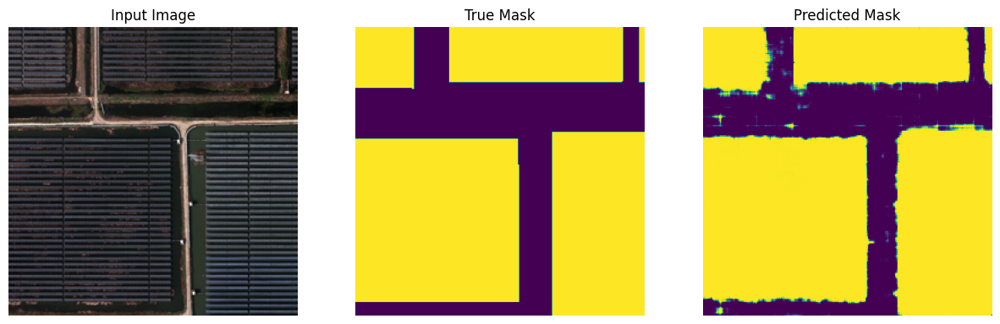

1/1 [==============================] - 0s 38ms/step


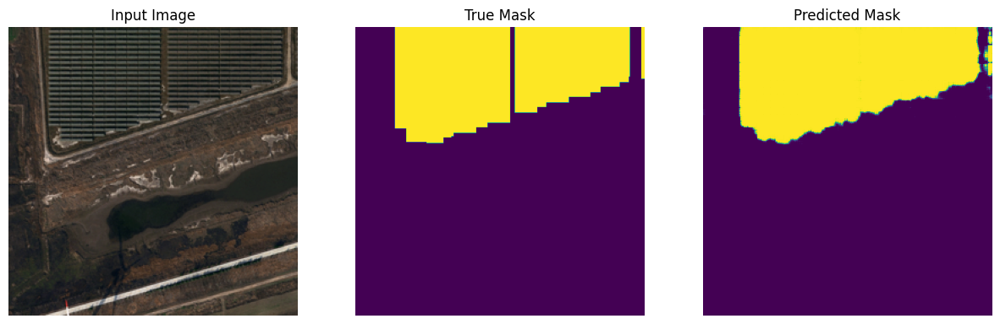

1/1 [==============================] - 0s 38ms/step


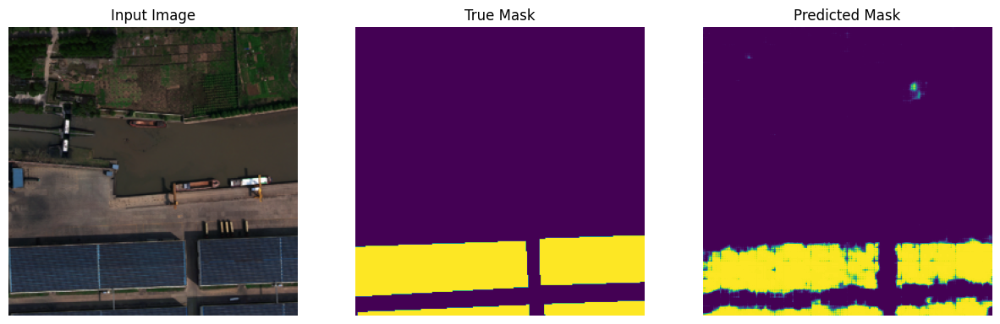

1/1 [==============================] - 0s 37ms/step


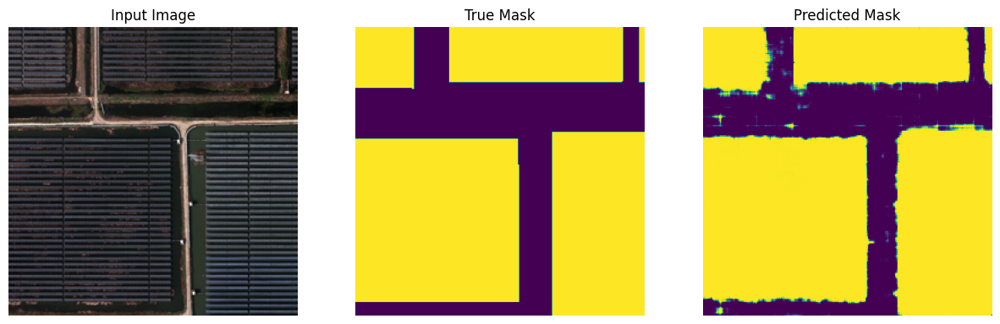

1/1 [==============================] - 0s 38ms/step


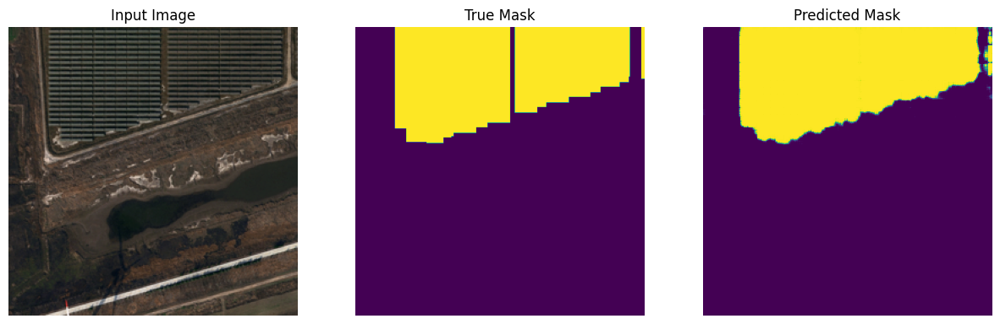

1/1 [==============================] - 0s 47ms/step


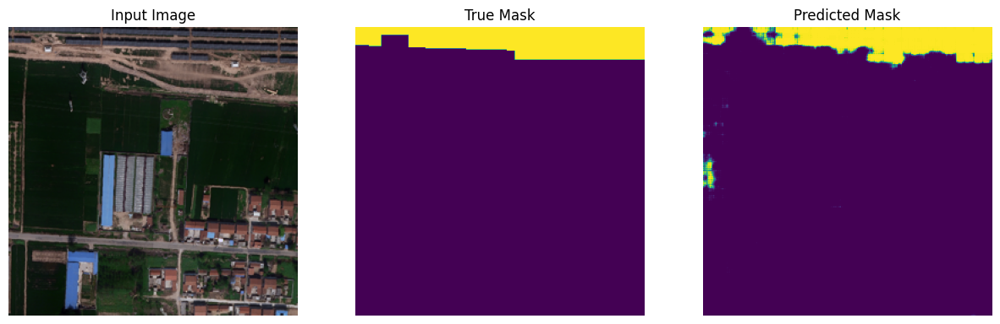

In [ ]:
for i in range(5):
    for image, mask in valid.take(i):
        sample_x, sample_y = image, mask
        show_predictions(sample_x, sample_y)

In [ ]:
### save final checkpoints to the disk
### Use h5 extension
### Hint: https://www.tensorflow.org/guide/keras/save_and_serialize

############################################
######### YOUR CODES GO HERE ###############
newmodel.save_weights('/content/newmodel.h5')
############################################